Gatilho
0    329862
1      8152
Name: count, dtype: int64
Using cuda device
Step 1: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14018.0
Step 2: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14017.25
Step 3: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14013.75
Step 4: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14014.75
Step 5: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14017.75
Step 6: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14017.75
Step 7: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14017.5
Step 8: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14017.0
Step 9: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14019.5
Step 10: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14021.25
Step 11: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14020.25
Step 12: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14019.5
Step 13: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14022.0
Step 14: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14017.5
Step 15: Ação 1, Recompensa 0.

c:\Python39\lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Step 43: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14025.75
Step 44: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14025.25
Step 45: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14024.0
Step 46: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14019.25
Step 47: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14017.25
Step 48: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14019.5
Step 49: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14020.5
Step 50: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14019.75
Step 51: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14021.5
Step 52: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14021.75
Step 53: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14021.25
Step 54: Ação 2, Recompensa 0.0, Posição 0, Preço Atual 14023.5
Step 55: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14023.75
Step 56: Ação 0, Recompensa 0.0, Posição 0, Preço Atual 14022.75
Step 57: Ação 1, Recompensa 0.0, Posição 0, Preço Atual 14023.75
Step 58: Ação 2, Recompensa 0.

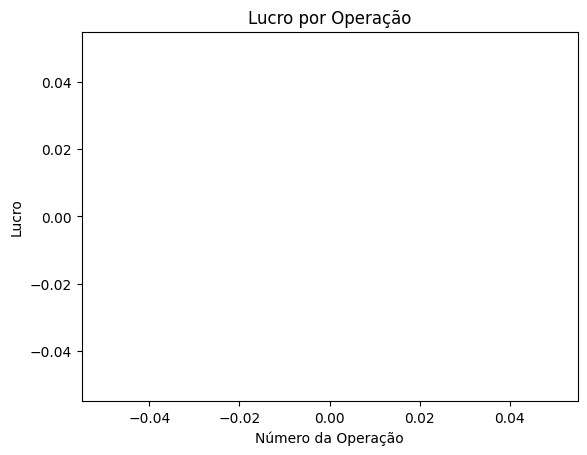

In [3]:
# Importar as bibliotecas necessárias
import pandas as pd
import numpy as np
import gym
from gym import spaces
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.callbacks import BaseCallback
import matplotlib.pyplot as plt

# Carregar o conjunto de dados
data = pd.read_csv('D:\\dados\\bar_M1_data_07-08-2024.csv')

# Garantir que a coluna DateTime esteja no formato datetime
data['DateTime'] = pd.to_datetime(data['DateTime'])

# Ordenar os dados por DateTime
data.sort_values('DateTime', inplace=True)

# Resetar o índice após ordenar
data.reset_index(drop=True, inplace=True)

# Tratar valores ausentes, se houver
data.dropna(inplace=True)

# Dividir os dados em conjunto de treinamento e teste
train_size = int(len(data) * 0.7)
train_df = data.iloc[:train_size].reset_index(drop=True)
test_df = data.iloc[train_size:].reset_index(drop=True)

# Verificar a distribuição dos valores de 'Gatilho'
print(train_df['Gatilho'].value_counts())

# Definir o ambiente personalizado
class TradingEnv(gym.Env):
    metadata = {'render.modes': ['human']}
    
    def __init__(self, df, balancing_factor=0.1, profit_threshold=1.0):
        super(TradingEnv, self).__init__()

        self.df = df.reset_index(drop=True)
        self.total_steps = len(df) - 1
        self.current_step = 0

        # Definir o espaço de ações: 0 = Manter/Não Fazer Nada, 1 = Comprar, 2 = Vender
        self.action_space = spaces.Discrete(3)

        # Excluir colunas não numéricas da observação
        self.feature_columns = [col for col in df.columns if col not in ['DateTime', 'Gatilho']]
        # Definir o espaço de observação: forma igual ao número de features
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(len(self.feature_columns),), dtype=np.float32
        )

        # Inicializar variáveis de estado
        self.position = 0  # 1 para comprado, -1 para vendido, 0 para sem posição
        self.entry_price = 0.0
        self.done = False
        self.gains = []
        self.trades = []
        self.consecutive_wins = 0
        self.consecutive_losses = 0
        self.balancing_factor = balancing_factor
        self.profit_threshold = profit_threshold
        self.allow_new_trade = True  # Para limitação dinâmica

        self.info = {}  # Para armazenar informações para o callback

    def reset(self):
        self.current_step = 0
        self.position = 0
        self.entry_price = 0.0
        self.done = False
        self.gains = []
        self.trades = []
        self.consecutive_wins = 0
        self.consecutive_losses = 0
        self.allow_new_trade = True
        self.info = {}

        return self._next_observation()

    def _next_observation(self):
        obs = self.df.loc[self.current_step, self.feature_columns].values.astype('float32')
        return obs

    def step(self, action):
        current_data = self.df.iloc[self.current_step]
        trigger = current_data['Gatilho']
        reward = 0.0
        done = False
        info = {}

        # Lógica do "Gatilho"
        if trigger == 0:
            # Deve fechar qualquer posição aberta
            if self.position != 0:
                reward += self._close_position(current_data['Close'])
            self.allow_new_trade = False  # Não permitir novas operações quando Gatilho é 0
        else:
            # Permitir novas operações quando Gatilho for diferente de zero
            self.allow_new_trade = True

            # Operações são permitidas
            if self.position == 0 and self.allow_new_trade:
                if action == 1:  # Comprar
                    self.position = 1
                    self.entry_price = current_data['Close']
                elif action == 2:  # Vender
                    self.position = -1
                    self.entry_price = current_data['Close']
                else:
                    pass  # Não fez nada
            elif self.position != 0:
                # Decidir se mantém ou fecha a posição
                if action == 0:
                    pass  # Mantém a posição
                else:
                    reward += self._close_position(current_data['Close'])

        # Próximo passo no tempo
        self.current_step += 1
        if self.current_step >= self.total_steps:
            done = True

        # Preparar a próxima observação
        obs = self._next_observation()

        # Armazenar informações para o callback
        self.info = {
            'action': action,
            'reward': reward,
            'position': self.position,
            'entry_price': self.entry_price,
            'current_price': current_data['Close'],
            'step': self.current_step
        }

        return obs, reward, done, info

    def _close_position(self, close_price):
        profit = 0.0
        if self.position == 1:
            profit = close_price - self.entry_price
        elif self.position == -1:
            profit = self.entry_price - close_price

        self.gains.append(profit)
        self.trades.append({
            'entry_price': self.entry_price,
            'exit_price': close_price,
            'profit': profit,
            'position': self.position,
            'step': self.current_step
        })

        # Atualizar sequências de acertos/erros
        if profit > 0:
            self.consecutive_wins += 1
            self.consecutive_losses = 0
        else:
            self.consecutive_wins = 0
            self.consecutive_losses += 1

        # Recompensa base é o lucro/prejuízo
        reward = profit

        # Aplicar recompensas ou penalidades extras
        reward += self._apply_accuracy_reward_penalty()

        # Remover a limitação dinâmica
        # if profit >= self.profit_threshold:
        #     self.allow_new_trade = True
        # else:
        #     self.allow_new_trade = False

        # Resetar posição
        self.position = 0
        self.entry_price = 0.0

        return reward

    def _apply_accuracy_reward_penalty(self):
        reward_adjustment = 0.0

        # Recompensa por alta assertividade
        if self.consecutive_wins >= 3:
            reward_adjustment += self.consecutive_wins * self.balancing_factor

        # Penalidade por sequência de erros
        if self.consecutive_losses >= 3:
            reward_adjustment -= self.consecutive_losses * self.balancing_factor

        return reward_adjustment

    def render(self, mode='human'):
        # Opcional: implementar visualização
        pass

# Definir o callback personalizado
class LoggingCallback(BaseCallback):
    def __init__(self, verbose=0):
        super(LoggingCallback, self).__init__(verbose)
    
    def _on_step(self) -> bool:
        # Obter informações do ambiente
        env = self.training_env.envs[0]
        if hasattr(env, 'info'):
            info = env.info
            print(f"Step {info['step']}: Ação {info['action']}, Recompensa {info['reward']}, Posição {info['position']}, Preço Atual {info['current_price']}")
        return True

# Criar o ambiente de treinamento com profit_threshold ajustado
env = DummyVecEnv([lambda: TradingEnv(train_df, profit_threshold=1.0)])

# Inicializar o agente
model = PPO('MlpPolicy', env, verbose=1)

# Criar a instância do callback
logging_callback = LoggingCallback()

# Treinar o agente com o callback
model.learn(total_timesteps=100000, callback=logging_callback)

# Salvar o modelo treinado
model.save('ppo_trading_agent')

# Avaliar o agente
eval_env = TradingEnv(test_df)

obs = eval_env.reset()
for _ in range(len(test_df) - 1):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done, info = eval_env.step(action)
    print(f"Teste Step {eval_env.current_step}: Ação {action}, Recompensa {reward}")
    if done:
        break

# Calcular o lucro total
total_profit = sum([trade['profit'] for trade in eval_env.trades])
print(f'Lucro Total: {total_profit}')

# Analisar as operações
profits = [trade['profit'] for trade in eval_env.trades]
plt.plot(profits)
plt.title('Lucro por Operação')
plt.xlabel('Número da Operação')
plt.ylabel('Lucro')
plt.show()
